# Notebook 3.1 do Projeto 1 do PB Ciência de Dados da Compass UOL
#### Autora: Amanda Mota Passos
Neste notebook, serão respondidas as perguntas 6 a 9 do desafio.
As variáveis _id serão utilizadas para conectar tabelas diferentes, mas não serão analisadas pois não possuem significado além da identificação.

## 1. Importando pandas, numpy, matplotlib e plotly

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px

##### Aviso: todos os gráficos plotados com a biblioteca plotly não aparecem no github no output dos códigos, então a imagem destes gráficos está logo abaixo de cada código em células markdown

## 2. Lendo as tabelas 

In [2]:
sellers = pd.read_csv("C:\\Users\\amand\\Downloads\\repositório do projeto\\tables\\sellers_treated.csv")
products = pd.read_csv("C:\\Users\\amand\\Downloads\\repositório do projeto\\tables\\products_treated.csv")
order_reviews = pd.read_csv("C:\\Users\\amand\\Downloads\\repositório do projeto\\tables\\order_reviews_treated.csv")
orders = pd.read_csv("C:\\Users\\amand\\Downloads\\repositório do projeto\\tables\\orders_treated.csv")
order_payments = pd.read_csv("C:\\Users\\amand\\Downloads\\repositório do projeto\\tables\\order_payments_treated.csv")
order_items = pd.read_csv("C:\\Users\\amand\\Downloads\\repositório do projeto\\tables\\order_items_treated.csv")
geolocation = pd.read_csv("C:\\Users\\amand\\Downloads\\repositório do projeto\\tables\\geolocation_treated.csv", encoding="latin-1")
customers = pd.read_csv("C:\\Users\\amand\\Downloads\\repositório do projeto\\tables\\customers_treated.csv")

##### Refazendo alguns merges do notebook3

In [3]:
order_items_and_payments = pd.merge(order_items, order_payments, on = ['order_id'], how="left") #foi feito um left join
#pois a tabela order_items possui menos linhas e colunas que a order_payments

In [4]:
orders_i_p = pd.merge(orders,order_items_and_payments, on =["order_id"], how="left")

## 3. Respostas das perguntas 6 a 9 do desafio

#### 6. Top 10 melhores sellers (com mais reviews positivas)

Para responder esta pergunta e a próxima, primeiro será realizado um merge das tabelas order_items e order_reviews para que seja possível utilizar conjuntamente as colunas seller_id e review_score. Após o merge, será criado um dicionário (dict_somas) que posssui como chave o seller_id e como valores desta chave, a soma das review_scores e a quantidade de reviews de cada seller. Após isso, será criado o dicionário dict_medias_bayes, que utiliza os valores do dict_somas e calcula, por meio da fórmula, a Média Bayesiana das reviews de cada seller. A média bayesiana foi escolhida para esta análise pois ela leva em conta a quantidade de reviews de cada seller como sendo pesos, não é apenas a divisão entre a soma e a quantidade. Depois, este dicionário será ordenado de forma decrescente, para obtermos as maiores médias, e de forma crescente, para obtermos as menores médias. Os melhores sellers serão aqueles com média bayesiana de reviews maior ou igual a 4. Os piores sellers serão aqueles com média bayesiana menor que 4.

In [5]:
items_and_reviews=pd.merge(order_items,order_reviews,on=['order_id'], how="left") #Merge das tabelas

In [6]:
#Construindo o dicionário com as somas dos scores e a quantidade de avaliações de cada seller.
import math
dict_somas = dict()
for i in items_and_reviews.itertuples():
    idv = i.seller_id
    score = i.review_score
    if (math.isnan(score)):
        continue
    if idv in dict_somas:
        dict_somas[idv][0] += score
        dict_somas[idv][1] +=1
    else:
        dict_somas[idv] = [score,1]

In [7]:
#Construindo o dicionário que contém as médias bayesianas de cada seller, sabendo que a fórmula da média bayesiana inclui 
# o valor do quantil 25%, as somas obtidas no dicionário dict_somas e uma lista criada com os valores das quantidades de avaliações de cada seller.
lista=[] 
dict_medias_bayes = {}
for key, value in dict_somas.items():
    lista.append(value[1])
    C= np.quantile(lista,0.25)
    dict_medias_bayes[key] = ((((value[0]/value[1]) * C) + value[1])/(C + value[1]))

In [8]:
#ordenação decrescente do dicionário dict_medias_bayes:
for i in sorted(dict_medias_bayes, key = dict_medias_bayes.get, reverse=True):
    print(i, dict_medias_bayes[i])

702835e4b785b67a084280efca355756 4.911111111111111
47efca563408aae19bb7206c2d969ea9 4.902439024390244
c092292535a57dacd95a8765f5518f87 4.864406779661017
ce3ad9de960102d0677a81f5d0bb7b2d 4.851851851851852
bba3293d6f5d5af2f415e004e8b93ae3 4.84
a3b0df0065e264a91b7bbf5f844af5cd 4.804878048780488
4ddeb3e828550cddc8d45c8bc36ab2d1 4.75
436bf27f2f18474fc6047702e9f8a866 4.733333333333333
4f0d637c1197fd65405ebd755ac9f86b 4.6923076923076925
35b96509602ec4b7da831b5cd73ff2c2 4.6923076923076925
720e6cf846ea7572cbb66b743fb91e6c 4.6923076923076925
75fdd0a732287f9497b179f6bd445d32 4.6923076923076925
0ee4fb99ac55ffbbc98795aa01b7f8fa 4.666666666666667
7cf4ea70955b00d6b3c22542598e2715 4.666666666666667
f205b1a3ca9a34e0f8a228bae6e4c7b3 4.636363636363637
4aba6a02a788d3ec81c03137144d9a80 4.636363636363637
3289d8c3eef4873f91ce0b1343c0dd58 4.636363636363637
1b61fb1f0f2185d89e9a126c498e9cc7 4.636363636363637
c3e2398fcc7e581cda2e546557bf6968 4.636363636363637
257e61d3251fb5efb9daadddbc2cf7ca 4.636363636363637
5d

Top 10 melhores sellers (Média bayesiana >=4) e suas respectivas médias bayesianas:

1. 702835e4b785b67a084280efca355756: 4.911111111111111
2. 47efca563408aae19bb7206c2d969ea9: 4.902439024390244
3. c092292535a57dacd95a8765f5518f87: 4.864406779661017
4. ce3ad9de960102d0677a81f5d0bb7b2d: 4.851851851851852
5. bba3293d6f5d5af2f415e004e8b93ae3: 4.84
6. a3b0df0065e264a91b7bbf5f844af5cd: 4.804878048780488
7. 4ddeb3e828550cddc8d45c8bc36ab2d1: 4.75
8. 436bf27f2f18474fc6047702e9f8a866: 4.733333333333333
9. 4f0d637c1197fd65405ebd755ac9f86b: 4.6923076923076925
10. 35b96509602ec4b7da831b5cd73ff2c2: 4.6923076923076925


#### 7. Top 10 piores sellers (com mais reviews negativas)

In [9]:
#ordenação crescente do dicionário dict_medias_bayes:
for i in sorted(dict_medias_bayes, key = dict_medias_bayes.get):
    print(i, dict_medias_bayes[i])

5ca5d579b5857ee8709479b1047cecc3 1.0
c85d7b477a709c85a1e8b8f25aa1b270 1.0
37ceb404da208418c9032f0674e57804 1.0
66d5ae34537110d3affc56174dad2b2f 1.0
cc1f04647be106ba74e62b21f358af25 1.0
da2782c804606d2a5d8e1760dbb3e7ec 1.0
391bbd13b6452244774beff1824006ed 1.0
3a52d63a8f9daf5a28f3626d7eb9bd28 1.0
3338e7a0710a195872be80e0d2423867 1.0
dc120d932ddf9d4dfb6fd68beefda622 1.0
bcf5566870987da7bc811fbc8c5b9fd9 1.0
d65f31d2413268e671989503f6cf9993 1.0
87f3e35268860433e13d577825aada95 1.0
07d75e33f2750d97d467fb57e4dfdd8a 1.0
984c273121e743dd14767befe6cb17f5 1.0
5c603ffb38cbbf25a0e0698941324143 1.0
f7df46c1e0ec44eed5c6726478da4a17 1.0
19484c79cef6c062cb177aa4ef2fcc3c 1.0
c286ec035ee04ba81c97508f0b5df544 1.0
324583d68897f5ddbaf38f6248322176 1.0
f5403d3f50089112c4eed37928b7f622 1.0
e6ffc9ac6a7adc9d16a1cfc2286dd546 1.0
79ee721b6f766066a80264402548d359 1.0
c87abc38c8ed3240861729e1aeadf221 1.0
1967a9e2ad6f51802b093147d861df58 1.0
e1a210d482714ce337763a19aef94ba4 1.0
63bc58679c44e8a998792119fd7ad23e 1.0
6

Top 10 piores sellers (Média bayesiana < 4) e suas respectivas médias bayesianas:

1. 5ca5d579b5857ee8709479b1047cecc3: 1.0
2. c85d7b477a709c85a1e8b8f25aa1b270: 1.0
3. 37ceb404da208418c9032f0674e57804: 1.0
4. 66d5ae34537110d3affc56174dad2b2f: 1.0
5. cc1f04647be106ba74e62b21f358af25: 1.0
6. da2782c804606d2a5d8e1760dbb3e7ec: 1.0
7. 391bbd13b6452244774beff1824006ed: 1.0
8. 3a52d63a8f9daf5a28f3626d7eb9bd28: 1.0
9. 3338e7a0710a195872be80e0d2423867: 1.0
10. dc120d932ddf9d4dfb6fd68beefda622: 1.0

#### 8. Existe relação entre a quantidade de vendas e a quantidade de reviews para os sellers? É possível identificar aumento ou queda na venda de um seller com base nas avaliações do que já foi vendido no passado? 

In [10]:
items_and_reviews['Freq'] = items_and_reviews.groupby('seller_id')['seller_id'].transform('count')
    
#Criando uma nova coluna chamada Freq para contar quantas vezes determinado seller_id se repete e armazenar a informação

In [11]:
items_and_reviews.sort_values(by="Freq", ascending=False).head(10)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp,Freq
23919,40f27de71845c6aebc742107208b5c2b,2,91442659f31ec0f0fc73215e77854fac,6560211a19b47992c3666cc44a7e94c0,2017-10-18 11:49:31,55.00,7.78,6d177f1084456509f46fdbc9e5d014ee,4.0,NaN,NaN,2017-10-19 00:00:00,2017-12-21 22:19:00,1961
52195,8de1aae5083a3fd8914d84cfcf07dbbd,1,7b66b19cf13720604859bcd8c48c0dab,6560211a19b47992c3666cc44a7e94c0,2018-03-02 16:31:24,55.00,14.15,b2c51e78846995db57518525beafdc3d,1.0,NaN,NaN,2018-03-01 00:00:00,2018-03-01 19:05:15,1961
80952,dafe7fe42ee9fb39d4c5f957e0799cf4,1,91442659f31ec0f0fc73215e77854fac,6560211a19b47992c3666cc44a7e94c0,2018-07-02 01:11:20,55.00,15.49,b7863f2008a6647b0c0c6723ec0e2ceb,5.0,NaN,NaN,2018-07-04 00:00:00,2018-07-05 18:15:09,1961
27892,4b6aca1937b0119de6bd8be675067173,1,a1250bbcaa645885c9165eab1573b5c6,6560211a19b47992c3666cc44a7e94c0,2017-11-03 09:44:57,49.99,7.78,69a671faf03580bd0d351219c564d7d3,2.0,NaN,Fiz comprar lannister d 2 carteira paguei \r\n...,2017-11-05 00:00:00,2017-11-05 19:56:41,1961
27893,4b6aca1937b0119de6bd8be675067173,2,d103baa8d35783ff2772704ed17ddd45,6560211a19b47992c3666cc44a7e94c0,2017-11-03 09:44:57,59.00,7.78,69a671faf03580bd0d351219c564d7d3,2.0,NaN,Fiz comprar lannister d 2 carteira paguei \r\n...,2017-11-05 00:00:00,2017-11-05 19:56:41,1961
63666,acbe08c609ccb7901159882c5a558cfa,1,2136c70bbe723d338fab53da3c03e6dc,6560211a19b47992c3666cc44a7e94c0,2017-11-14 12:10:32,29.00,7.78,4d73d07a4d86bd25d78c649777701d90,5.0,NaN,Foi muito mais rápido do que o esperado.\r\nRE...,2017-11-10 00:00:00,2017-11-10 22:27:47,1961
25640,45623f1421557207f2d93ca576418a4e,1,31d6f0a621ee145ae8c70304cf564483,6560211a19b47992c3666cc44a7e94c0,2018-05-21 08:12:43,35.00,19.04,d9c9222aafb3b2021630e68774ba2727,5.0,NaN,NaN,2018-06-08 00:00:00,2018-06-08 21:58:33,1961
6972,12e6f847bdf86df79a51931bbd0798b9,1,d103baa8d35783ff2772704ed17ddd45,6560211a19b47992c3666cc44a7e94c0,2017-07-20 21:50:16,59.00,14.16,d1f610e6fa8b74f0f7918672b8d3677e,4.0,NaN,"Produto atendeu minhas espectativas, com vário...",2017-07-25 00:00:00,2017-07-25 23:33:34,1961
21577,3a7fcc00c5d5f8bd9daf0c246bd93a54,1,10335f29114548c89998eb43398f58e5,6560211a19b47992c3666cc44a7e94c0,2018-01-26 13:50:47,89.00,12.12,e517b67174d8b9f18eb4b84912b9da68,5.0,NaN,NaN,2018-01-30 00:00:00,2018-01-31 11:59:23,1961
60410,a4291e3f3a5a6350fb7624dc6a892bce,1,5d7c23067ed3fc8c6e699b9373d5890b,6560211a19b47992c3666cc44a7e94c0,2018-02-27 16:50:44,49.00,11.85,0a53af47c17f5f9f1249b90d4f69d1be,5.0,NaN,NaN,2018-03-05 00:00:00,2018-03-05 16:55:31,1961


In [12]:
quantidd = pd.DataFrame() #Criando novo dataframe apenas com o seller_id e a sua frequência

In [13]:
quantidd = quantidd.join(items_and_reviews["seller_id"], how="outer", rsuffix="2")

In [14]:
quantidd = quantidd.join(items_and_reviews["Freq"], how="outer", rsuffix = "2")

In [15]:
q_por_seller = quantidd.drop_duplicates() #Apagando as duplicatas, pois os sellers e suas frequências se repetem na quantidade de
#suas frequências

In [16]:
q_por_seller.sort_values(by="Freq", ascending=False) 

,seller_id,Freq
20,6560211a19b47992c3666cc44a7e94c0,1961
11,4a3ca9315b744ce9f8e9374361493884,1865
9,cc419e0650a3c5ba77189a1882b7556a,1778
12,1f50f920176fa81dab994f9023523100,1760
425,da8622b14eb17ae2831f4ac5b9dab84a,1502
...,...,...
51104,6e85dc5ecd97a61094b89b046a509d8e,1
8754,e9874ae10b2d60d43917b6bbfa13a599,1
50933,fb503a924a0b9db19d83dd0ac6dbef8c,1
50918,fdf736c18c589ed030e058312203e1b2,1


In [17]:
q_por_seller.sort_values(by="Freq", ascending=True) 

,seller_id,Freq
94524,4391ea5c5990502176a1dcda44a2373d,1
52518,dda37071807e404c5bb2a1590c66326f,1
52689,f3041c2e75ec683697a6a5ea82192210,1
19465,c240c4061717ac1806ae6ee72be3533b,1
5195,0ee4fb99ac55ffbbc98795aa01b7f8fa,1
...,...,...
425,da8622b14eb17ae2831f4ac5b9dab84a,1502
12,1f50f920176fa81dab994f9023523100,1760
9,cc419e0650a3c5ba77189a1882b7556a,1778
11,4a3ca9315b744ce9f8e9374361493884,1865


Essas são as quantidades de vendas de cada vendedor 

Utilizando o dicionário dict_somas feito anteriormente, vamos procurar as chaves (seller_id) dos cinco vendedores com mais vendas e os cinco com menos vendas e visualizar a quantidade de reviews. 

In [18]:
for i in sorted(dict_somas, key = dict_somas.get, reverse=True):
    print(i, dict_somas[i])

6560211a19b47992c3666cc44a7e94c0 [7626.0, 1944]
cc419e0650a3c5ba77189a1882b7556a [7212.0, 1770]
4a3ca9315b744ce9f8e9374361493884 [7043.0, 1842]
1f50f920176fa81dab994f9023523100 [7005.0, 1753]
da8622b14eb17ae2831f4ac5b9dab84a [6126.0, 1497]
955fee9216a65b617aa5c0531780ce60 [5069.0, 1254]
7a67c85e85bb2ce8582c35f2203ad736 [4748.0, 1120]
ea8482cd71df3c1969d7b9473ff13abc [4547.0, 1150]
1025f0e2d44d7041d6cf58b6550e0bfa [4322.0, 1131]
3d871de0142ce09b7081e2b9d1733cb1 [4210.0, 1019]
8b321bb669392f5163d04c59e235e066 [3935.0, 987]
4869f7a5dfa277a7dca6462dcf3b52b2 [3774.0, 918]
cca3071e3e9bb7d12640c9fbe2301306 [3036.0, 789]
e9779976487b77c6d4ac45f75ec7afe9 [3003.0, 720]
f8db351d8c4c4c22c6835c19a46f01b0 [2849.0, 673]
620c87c171fb2a6dd6e8bb4dec959fc6 [2609.0, 622]
391fc6631aebcf3004804e51b40bcf1e [2334.0, 590]
d2374cbcbb3ca4ab1086534108cc3ab7 [2284.0, 629]
128639473a139ac0f3e5f5ade55873a5 [2121.0, 504]
d91fb3b7d041e83b64a00a3edfb37e4f [2113.0, 513]
85d9eb9ddc5d00ca9336a2219c97bb13 [2083.0, 498]
7c6

* Cinco com mais vendas:

In [19]:
seller1=dict_somas["6560211a19b47992c3666cc44a7e94c0"] 
print(seller1) #Resultado: 1944 reviews

[7626.0, 1944]


In [20]:
seller2=dict_somas["4a3ca9315b744ce9f8e9374361493884"]
print(seller2) #Resultado: 1842 reviews

[7043.0, 1842]


In [21]:
seller3=dict_somas["cc419e0650a3c5ba77189a1882b7556a"]
print(seller3) #Resultado: 1770 reviews

[7212.0, 1770]


In [22]:
seller4=dict_somas["1f50f920176fa81dab994f9023523100"]
print(seller4) #Resultado: 1753 reviews

[7005.0, 1753]


In [23]:
seller5=dict_somas["da8622b14eb17ae2831f4ac5b9dab84a"]
print(seller5) #Resultado: 1497 reviews

[6126.0, 1497]


* Cinco com menos vendas:

In [24]:
seller2779=dict_somas["4391ea5c5990502176a1dcda44a2373d"]
print(seller2779) #Resultado: 1 review

[4.0, 1]


In [25]:
seller2778=dict_somas["dda37071807e404c5bb2a1590c66326f"]
print(seller2778) #Resultado: 1 review

[5.0, 1]


In [26]:
seller2777=dict_somas["f3041c2e75ec683697a6a5ea82192210"]
print(seller2777) #Resultado: 1 review

[5.0, 1]


In [27]:
seller2776=dict_somas["c240c4061717ac1806ae6ee72be3533b"]
print(seller2776) #Resultado: 1 review

[4.0, 1]


In [28]:
seller2775=dict_somas["0ee4fb99ac55ffbbc98795aa01b7f8fa"]
print(seller2775) #Resultado: 1 review

[5.0, 1]


In [29]:
q_por_seller.sort_values(by="Freq") 

,seller_id,Freq
94524,4391ea5c5990502176a1dcda44a2373d,1
52518,dda37071807e404c5bb2a1590c66326f,1
52689,f3041c2e75ec683697a6a5ea82192210,1
19465,c240c4061717ac1806ae6ee72be3533b,1
5195,0ee4fb99ac55ffbbc98795aa01b7f8fa,1
...,...,...
425,da8622b14eb17ae2831f4ac5b9dab84a,1502
12,1f50f920176fa81dab994f9023523100,1760
9,cc419e0650a3c5ba77189a1882b7556a,1778
11,4a3ca9315b744ce9f8e9374361493884,1865


In [34]:
q_por_seller = q_por_seller.join(pd.DataFrame(lista), how="right", rsuffix="quantidd_reviews")
#Adicionando a lista criada com os valores das quantidades de reviews como uma coluna no dataframe q_por_seller

In [35]:
q_por_seller.head()

,seller_id,Freq,0,0quantidd_reviews
0,48436dade18ac8b2bce089ec2a041202,137.0,137,137
1,dd7ddc04e1b6c2c614352b383efe2d36,126.0,126,126
2,5b51032eddd242adc84c38acab88f23d,10.0,10,10
3,9d7a1d34a5052409006425275ba1c2b4,14.0,14,14
4,df560393f3a51e74553ab94004ba5c87,27.0,27,27


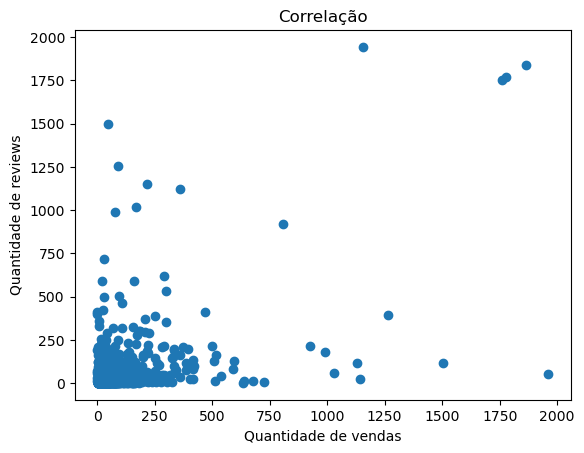

In [36]:
plt.scatter(q_por_seller["Freq"], q_por_seller["0quantidd_reviews"])
plt.title('Correlação')
plt.xlabel('Quantidade de vendas')
plt.ylabel('Quantidade de reviews')
plt.grid(False)
plt.show()

Além da análise feita de forma manual, observando os 5 vendedores com mais e menos vendas e suas respectivas quantidades de reviews, o gráfico de dispersão acima mostra que existe sim uma correlação entre a quantidade de vendas e a quantidade de reviews. Quanto mais próxima de 0 é a quantidade de vendas, mais próxima de 0 é a quantidade de reviews, e quanto maior é a quantidade de vendas, maior é a de reviews.

#### 9. Tópico livre: traga mais algum insight que podemos observar no dataset mas que não foi abordado nas perguntas

Neste tópico livre, serão analisadas as receitas por tipos de pagamento e as receitas por estado dos clientes

In [37]:
hist_payment_type=px.histogram(order_payments, x="payment_type", y="payment_value")
hist_payment_type.update_layout(width=600,height=400,title_font_color = 'purple')

hist_payment_type.update_layout(title= 'Formas de pagamentos e suas respectivas receitas')

hist_payment_type.show()

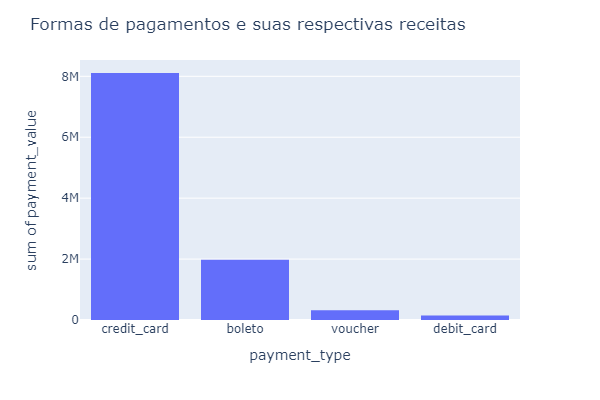

Com base no gráfico acima, é possível visualizar que a forma de pagamento mais popular nas vendas desta empresa é o cartão de crédito, com uma receita de mais de 8 milhões de reais. Já a forma de pagamento menos popular é o cartão de débito, com uma receita de apenas 150 mil reais.

In [38]:
customers_orders = pd.merge(customers, orders_i_p, on = ["customer_id"], how="left")
#Fazendo um merge para utilizar as variáveis customer_state e payment_value juntas

In [39]:
hist_customer_state=px.histogram(customers_orders, x="customer_state", y="payment_value")
hist_customer_state.update_layout(width=700,height=400,title_font_color = 'purple')

hist_customer_state.update_layout(title= 'Soma da receita por estado dos clientes')

hist_customer_state.show()

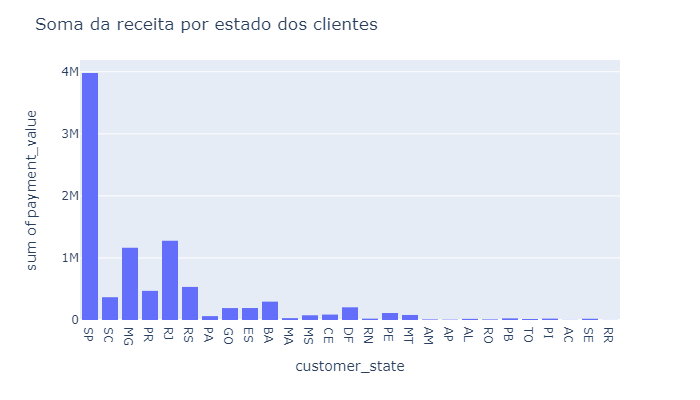

Com base no gráfico acima, é possível visualizar que o estado brasileiro dos clientes com maior receita é São Paulo, com uma receita de quase 4 milhões de reais. Já o estado dos clientes com menor receita é Roraima, com uma receita de apenas R$2.317,7.